<a href="https://colab.research.google.com/github/JozefSL/pyNotes/blob/main/XGB/TOUJANI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lehel + Giesing Revenue and Item Prediction

## Objective:<BR>
    Perform regression on time series hourly revenue for both Lehel's and Giesing's canteens.
    We will mainly use XGBoost regressor with some hyperparameter optimization as well as CatBoost and lightGBM to compare with and to help reducing error.<BR>
    
    
    


In [8]:
!pip install catboost

     |████████████████████████████████| 76.1 MB 1.1 MB/s 


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from scipy import stats
import matplotlib as mpl
import seaborn as sns
from IPython.display import HTML
%matplotlib inline
import sklearn

# Standard plotly imports
import plotly
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
py.init_notebook_mode(connected=True)

import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error
import imageio
import os
from statsmodels.graphics.tsaplots import plot_acf

import lightgbm as lgb
from catboost import Pool, CatBoostRegressor

In [10]:
# lehel_items_revenue = pd.read_csv('lehel_items_revenue', engine="python", index_col=0)

In [ ]:
lehel_items_revenue.head(10)

,Date,Time,CashPoint,ItemNumber,Amount,ItemDescription,Revenue,NetTotal
0,2011-03-01,07:29,1,511,1,"Backwaren 1,00","1,00","5,54"
1,2011-03-01,07:30,1,1211,1,LeberkÃƒÂ¤se Semmel,"0,96","4,16"
2,2011-03-01,07:30,1,500,1,Semmeln,"0,20","4,16"
3,2011-03-01,07:34,1,1213,1,LeberkÃƒÂ¤se Teller,"2,03","12,61"
4,2011-03-01,07:34,1,500,1,Semmeln,"0,25","12,61"
5,2011-03-01,07:34,1,602,1,"Croissant 0,90","0,85","6,52"
6,2011-03-01,07:35,1,600,1,"Butterbreze 1,10","0,85","1,28"
7,2011-03-01,07:35,1,612,1,"belegte Backw. 1,40","1,30","1,28"
8,2011-03-01,07:35,1,507,1,"Breze 0,65","0,35","10,22"
10,2011-03-01,07:35,1,1200,1,Paar Wiener,"0,65","10,22"


In [ ]:
lehel_items_revenue.Date = lehel_items_revenue.Date.str.cat(lehel_items_revenue.Time, sep = " ")
lehel_items_revenue = lehel_items_revenue.drop(columns=['Time'])
lehel_items_revenue.index = lehel_items_revenue.Date
lehel_items_revenue = lehel_items_revenue.drop(columns=['Date'])
lehel_items_revenue.index = pd.to_datetime(lehel_items_revenue.index)

In [ ]:
lehel_revenue_hourly = lehel_items_revenue.drop(columns=['CashPoint','ItemNumber','Amount','ItemDescription','NetTotal'])

In [ ]:
lehel_revenue_hourly.Revenue = pd.to_numeric(lehel_revenue_hourly.Revenue.str.replace(',','.'))

In [ ]:
lehel_revenue_hourly = lehel_revenue_hourly.resample('h').sum()

In [ ]:
lehel_revenue_hourly.head(10)

,Revenue
Date,
2011-01-02 07:00:00,74.92
2011-01-02 08:00:00,77.67
2011-01-02 09:00:00,44.17
2011-01-02 10:00:00,0.00
2011-01-02 11:00:00,633.59
2011-01-02 12:00:00,709.84
2011-01-02 13:00:00,95.07
2011-01-02 14:00:00,0.00
2011-01-02 15:00:00,0.00


In [ ]:
lehel_revenue_hourly.to_csv('LehelRevenueHourly.csv')

In [ ]:
weather = pd.read_csv('weather.csv', engine="python", index_col=0,sep=';')

In [ ]:
weather.head(10)

,Month,Day,Hour,Minute,Temperature [2 m above gnd],Relative Humidity [2 m above gnd]
Year,,,,,,
2011,1,1,0,0,-1.26,96.0
2011,1,1,1,0,-1.24,96.0
2011,1,1,2,0,-0.99,96.0
2011,1,1,3,0,-0.67,97.0
2011,1,1,4,0,-0.78,96.0
2011,1,1,5,0,-1.06,95.0
2011,1,1,6,0,-1.36,91.0
2011,1,1,7,0,-1.33,88.0
2011,1,1,8,0,-1.24,86.0


In [ ]:
def split_data(data, split_date):
    return data[data.index <= split_date].copy(), \
           data[data.index >  split_date].copy()

C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



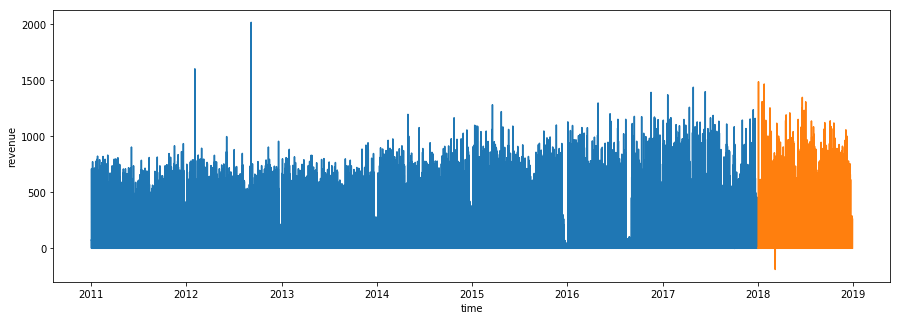

In [ ]:
train, test = split_data(lehel_revenue_hourly, '01-Jan-2018')

plt.figure(figsize=(15,5))
plt.xlabel('time')
plt.ylabel('revenue')
plt.plot(train.index,train)
plt.plot(test.index,test)
plt.show()

In [ ]:
trace1 = go.Scatter(
                    x = train.index,
                    y = train.Revenue,
                    mode = "lines",
                    name = "train",
                    marker = dict(color = 'rgba(70, 130, 180, 1)'))

trace2 = go.Scatter(
                    x = test.index,
                    y = test.Revenue,
                    mode = "lines",
                    name = "test",
                    marker = dict(color = 'rgba(255, 99, 71, 1)'))

data = [trace1,trace2]
layout = dict(title = 'Lehel Revenue Hourly',
              xaxis= dict(title= 'DateTime',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
py.iplot(fig)

## Create Time Series Features

They give more view points of the data: XGBoost will use them to find patterns not only from hour to hour, but by week, by season and so on.

In [ ]:
def create_features(df):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
     
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    return X

In [ ]:
X_train, y_train = create_features(train), train['Revenue']
X_test, y_test   = create_features(test), test['Revenue']

X_train.shape, y_train.shape

((61338, 8), (61338,))

In [ ]:
X_train.head()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
Date,,,,,,,,
2011-01-02 07:00:00,7,6,1,1,2011,2,2,52
2011-01-02 08:00:00,8,6,1,1,2011,2,2,52
2011-01-02 09:00:00,9,6,1,1,2011,2,2,52
2011-01-02 10:00:00,10,6,1,1,2011,2,2,52
2011-01-02 11:00:00,11,6,1,1,2011,2,2,52


## Create and Train XGBoost Model

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import *

params = {'min_child_weight':[6,7],'subsample':[i/10.0 for i in range(6,10)],
'colsample_bytree':[i/10.0 for i in range(6,11)], 'max_depth': [5,6,7]}

xgb0 = xgb.XGBRegressor(nthread=-1,tree_method='gpu_exact')

grid = GridSearchCV(xgb0, params)
grid.fit(X_train,y_train)

#Print the r2 score
#print(r2_score(y_test, grid.best_estimator_.predict(X_test)))


grid_pred = grid.best_estimator_.predict(X_test)

from sklearn.metrics import r2_score
r2_score(y_true=y_test, y_pred=grid_pred)

In [ ]:
reg = xgb.XGBRegressor(n_estimators=10000,
                       nthread=4,
                       min_child_weight=6,
                       learning_rate=0.5,
                       subsample=0.7,
                       max_depth=6,
                       colsample_bytree=0.6,
                       tree_method='gpu_exact',
                      )
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=90, #stop if n consequent rounds without decrease of error
        verbose=False) # Change verbose to True if you want to see it train
X_test_pred = reg.predict(X_test)

In [ ]:
from sklearn.metrics import r2_score
r2_score(y_true=y_test, y_pred=X_test_pred)

0.7099469894072661

In [ ]:
#reg = xgb.XGBRegressor(n_estimators=10000,
 #                      min_child_weight=7,
  #                     learning_rate=0.01,
   #                    subsample=0.8,
    #                   max_depth=6,
     #                  colsample_bytree=0.8,
      #                 tree_method='gpu_exact',
       #                )
#reg.fit(X_train, y_train,
 #       eval_set=[(X_train, y_train), (X_test, y_test)],
  #      early_stopping_rounds=80, #stop if n consequent rounds without decrease of error
   #     verbose=False) # Change verbose to True if you want to see it train

#X_test_pred = reg.predict(X_test)

##### CatBoost Model

In [ ]:
#CatBoostRegressor
train_pool = Pool(X_train, y_train) 
test_pool = Pool(X_test)
cbm0 = CatBoostRegressor(depth=10, learning_rate=0.01, eval_metric='RMSE',task_type="GPU")
#task_type="GPU"
cbm0.fit(train_pool)

X_test_pred_cat = cbm0.predict(test_pool)

0:	learn: 149.7629381	total: 110ms	remaining: 1m 49s
1:	learn: 148.6246840	total: 123ms	remaining: 1m 1s
2:	learn: 147.5003113	total: 134ms	remaining: 44.4s
3:	learn: 146.3887003	total: 144ms	remaining: 35.9s
4:	learn: 145.3058990	total: 156ms	remaining: 31s
5:	learn: 144.2350150	total: 168ms	remaining: 27.8s
6:	learn: 143.1737794	total: 179ms	remaining: 25.4s
7:	learn: 142.1278263	total: 192ms	remaining: 23.8s
8:	learn: 141.0803090	total: 203ms	remaining: 22.3s
9:	learn: 140.0455500	total: 214ms	remaining: 21.1s
10:	learn: 139.0253427	total: 225ms	remaining: 20.2s
11:	learn: 138.0178628	total: 235ms	remaining: 19.4s
12:	learn: 137.0224697	total: 247ms	remaining: 18.7s
13:	learn: 136.0377796	total: 257ms	remaining: 18.1s
14:	learn: 135.0797852	total: 269ms	remaining: 17.6s
15:	learn: 134.1334472	total: 279ms	remaining: 17.2s
16:	learn: 133.1855166	total: 290ms	remaining: 16.8s
17:	learn: 132.2456835	total: 303ms	remaining: 16.5s
18:	learn: 131.3146304	total: 316ms	remaining: 16.3s
19:	

163:	learn: 74.2223743	total: 2.03s	remaining: 10.4s
164:	learn: 74.1140964	total: 2.05s	remaining: 10.4s
165:	learn: 73.9971403	total: 2.06s	remaining: 10.3s
166:	learn: 73.8910212	total: 2.07s	remaining: 10.3s
167:	learn: 73.7840812	total: 2.08s	remaining: 10.3s
168:	learn: 73.6729463	total: 2.09s	remaining: 10.3s
169:	learn: 73.5699017	total: 2.1s	remaining: 10.3s
170:	learn: 73.4573846	total: 2.12s	remaining: 10.3s
171:	learn: 73.3542647	total: 2.13s	remaining: 10.3s
172:	learn: 73.2553583	total: 2.14s	remaining: 10.2s
173:	learn: 73.1590565	total: 2.16s	remaining: 10.2s
174:	learn: 73.0598429	total: 2.17s	remaining: 10.2s
175:	learn: 72.9654889	total: 2.18s	remaining: 10.2s
176:	learn: 72.8687897	total: 2.19s	remaining: 10.2s
177:	learn: 72.7784747	total: 2.21s	remaining: 10.2s
178:	learn: 72.6875128	total: 2.22s	remaining: 10.2s
179:	learn: 72.5932102	total: 2.23s	remaining: 10.2s
180:	learn: 72.5026419	total: 2.25s	remaining: 10.2s
181:	learn: 72.4133220	total: 2.26s	remaining: 

321:	learn: 66.7892863	total: 4.11s	remaining: 8.65s
322:	learn: 66.7733692	total: 4.12s	remaining: 8.63s
323:	learn: 66.7453069	total: 4.13s	remaining: 8.62s
324:	learn: 66.7322173	total: 4.14s	remaining: 8.61s
325:	learn: 66.7144333	total: 4.15s	remaining: 8.59s
326:	learn: 66.6871793	total: 4.17s	remaining: 8.57s
327:	learn: 66.6615929	total: 4.18s	remaining: 8.56s
328:	learn: 66.6402908	total: 4.19s	remaining: 8.54s
329:	learn: 66.6164094	total: 4.2s	remaining: 8.53s
330:	learn: 66.5992212	total: 4.21s	remaining: 8.51s
331:	learn: 66.5757285	total: 4.23s	remaining: 8.5s
332:	learn: 66.5571699	total: 4.24s	remaining: 8.49s
333:	learn: 66.5386727	total: 4.25s	remaining: 8.48s
334:	learn: 66.5212761	total: 4.26s	remaining: 8.46s
335:	learn: 66.5024356	total: 4.27s	remaining: 8.45s
336:	learn: 66.4795954	total: 4.29s	remaining: 8.43s
337:	learn: 66.4602170	total: 4.3s	remaining: 8.42s
338:	learn: 66.4413081	total: 4.31s	remaining: 8.41s
339:	learn: 66.4210193	total: 4.33s	remaining: 8.

486:	learn: 64.2481657	total: 6.21s	remaining: 6.54s
487:	learn: 64.2338931	total: 6.22s	remaining: 6.53s
488:	learn: 64.2244264	total: 6.24s	remaining: 6.52s
489:	learn: 64.2117267	total: 6.25s	remaining: 6.5s
490:	learn: 64.1966801	total: 6.26s	remaining: 6.49s
491:	learn: 64.1863524	total: 6.27s	remaining: 6.48s
492:	learn: 64.1761389	total: 6.29s	remaining: 6.46s
493:	learn: 64.1668242	total: 6.3s	remaining: 6.45s
494:	learn: 64.1591304	total: 6.31s	remaining: 6.44s
495:	learn: 64.1399559	total: 6.33s	remaining: 6.43s
496:	learn: 64.1309695	total: 6.34s	remaining: 6.41s
497:	learn: 64.1175902	total: 6.35s	remaining: 6.4s
498:	learn: 64.1031380	total: 6.36s	remaining: 6.39s
499:	learn: 64.0891709	total: 6.37s	remaining: 6.37s
500:	learn: 64.0804908	total: 6.38s	remaining: 6.36s
501:	learn: 64.0591407	total: 6.4s	remaining: 6.35s
502:	learn: 64.0408039	total: 6.41s	remaining: 6.34s
503:	learn: 64.0278315	total: 6.43s	remaining: 6.32s
504:	learn: 64.0089946	total: 6.44s	remaining: 6.3

652:	learn: 62.3200789	total: 8.43s	remaining: 4.48s
653:	learn: 62.3045817	total: 8.45s	remaining: 4.47s
654:	learn: 62.2915158	total: 8.46s	remaining: 4.46s
655:	learn: 62.2808282	total: 8.47s	remaining: 4.44s
656:	learn: 62.2704257	total: 8.48s	remaining: 4.43s
657:	learn: 62.2609705	total: 8.5s	remaining: 4.42s
658:	learn: 62.2492824	total: 8.51s	remaining: 4.4s
659:	learn: 62.2427053	total: 8.52s	remaining: 4.39s
660:	learn: 62.2295593	total: 8.54s	remaining: 4.38s
661:	learn: 62.2184900	total: 8.55s	remaining: 4.36s
662:	learn: 62.2142660	total: 8.56s	remaining: 4.35s
663:	learn: 62.2057583	total: 8.57s	remaining: 4.34s
664:	learn: 62.1940410	total: 8.58s	remaining: 4.32s
665:	learn: 62.1823466	total: 8.6s	remaining: 4.31s
666:	learn: 62.1753198	total: 8.61s	remaining: 4.3s
667:	learn: 62.1668990	total: 8.63s	remaining: 4.29s
668:	learn: 62.1531935	total: 8.64s	remaining: 4.27s
669:	learn: 62.1402028	total: 8.65s	remaining: 4.26s
670:	learn: 62.1341494	total: 8.66s	remaining: 4.2

820:	learn: 60.6530526	total: 10.7s	remaining: 2.32s
821:	learn: 60.6419450	total: 10.7s	remaining: 2.31s
822:	learn: 60.6268816	total: 10.7s	remaining: 2.3s
823:	learn: 60.6203564	total: 10.7s	remaining: 2.28s
824:	learn: 60.6124190	total: 10.7s	remaining: 2.27s
825:	learn: 60.5990549	total: 10.7s	remaining: 2.26s
826:	learn: 60.5942961	total: 10.7s	remaining: 2.25s
827:	learn: 60.5883616	total: 10.8s	remaining: 2.23s
828:	learn: 60.5821789	total: 10.8s	remaining: 2.22s
829:	learn: 60.5776642	total: 10.8s	remaining: 2.21s
830:	learn: 60.5703456	total: 10.8s	remaining: 2.2s
831:	learn: 60.5648631	total: 10.8s	remaining: 2.18s
832:	learn: 60.5570498	total: 10.8s	remaining: 2.17s
833:	learn: 60.5487121	total: 10.8s	remaining: 2.16s
834:	learn: 60.5365836	total: 10.9s	remaining: 2.15s
835:	learn: 60.5272841	total: 10.9s	remaining: 2.13s
836:	learn: 60.5206771	total: 10.9s	remaining: 2.12s
837:	learn: 60.5074329	total: 10.9s	remaining: 2.11s
838:	learn: 60.4953133	total: 10.9s	remaining: 2

988:	learn: 59.1018742	total: 12.9s	remaining: 144ms
989:	learn: 59.0960237	total: 12.9s	remaining: 130ms
990:	learn: 59.0883406	total: 12.9s	remaining: 117ms
991:	learn: 59.0822217	total: 12.9s	remaining: 104ms
992:	learn: 59.0726492	total: 13s	remaining: 91.4ms
993:	learn: 59.0679970	total: 13s	remaining: 78.3ms
994:	learn: 59.0647687	total: 13s	remaining: 65.3ms
995:	learn: 59.0512135	total: 13s	remaining: 52.2ms
996:	learn: 59.0411013	total: 13s	remaining: 39.2ms
997:	learn: 59.0298628	total: 13s	remaining: 26.1ms
998:	learn: 59.0226440	total: 13s	remaining: 13.1ms
999:	learn: 59.0033365	total: 13.1s	remaining: 0us


##### LightGBM model

In [ ]:
#LightGBMRegressor
gbm0 = lgb.LGBMRegressor(
    objective='regression',
    num_leaves=11,
    learning_rate=0.006,
    n_estimators=2000)

gbm0.fit(X_train, y_train, eval_metric='rmse')

X_test_pred_light = gbm0.predict(X_test)

## Feature Importances

Feature importance is a great way to get a general idea about which features the model is relying on most to make the prediction. This is a metric that simply sums up how many times each feature is split on.

We can see that hour was most commonly used to split trees, while the day of year and the day of week came in next. Quarter has low importance due to the fact that it could be created by different dayofyear splits.

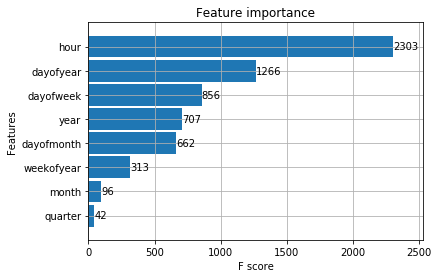

In [ ]:
xgb.plot_importance(reg, height=0.9)

## Forecast on Test Set

Show algorithm forecast for the whole test period and for january 2018.

In [ ]:
def plot_performance(base_data, date_from, date_to, title=None):
    plt.figure(figsize=(15,3))
    if title == None:
        plt.title('From {0} To {1}'.format(date_from, date_to))
    else:
        plt.title(title)
    plt.xlabel('time')
    plt.ylabel('Revenue')
    plt.plot(lehel_revenue_hourly.index,lehel_revenue_hourly, label='data')
    plt.plot(X_test.index,X_test_pred, label='prediction')
    plt.legend()
    plt.xlim(left=date_from, right=date_to)

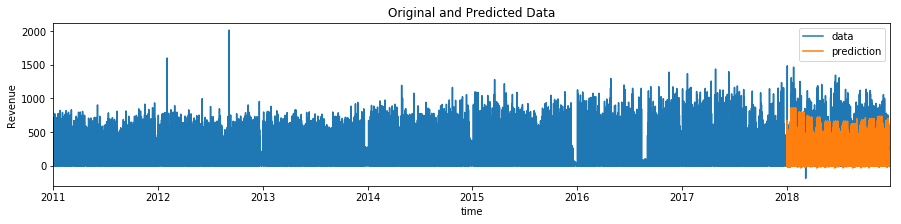

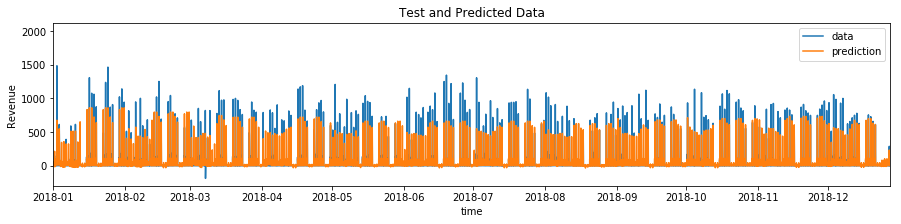

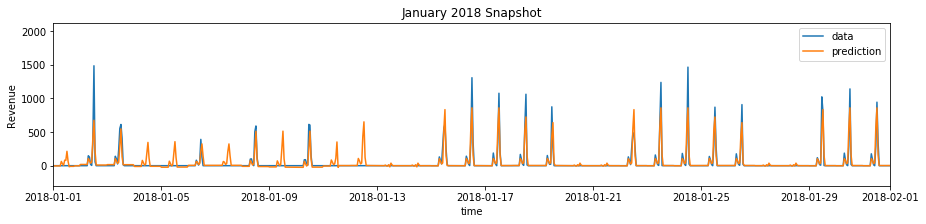

In [ ]:
plot_performance(lehel_revenue_hourly, lehel_revenue_hourly.index[0].date(), lehel_revenue_hourly.index[-1].date(),
                 'Original and Predicted Data')

plot_performance(y_test, y_test.index[0].date(), y_test.index[-1].date(),
                 'Test and Predicted Data')

plot_performance(y_test, '01-01-2018', '02-01-2018', 'January 2018 Snapshot')

plt.legend()

plt.show()

## Show forecast for ten random weeks

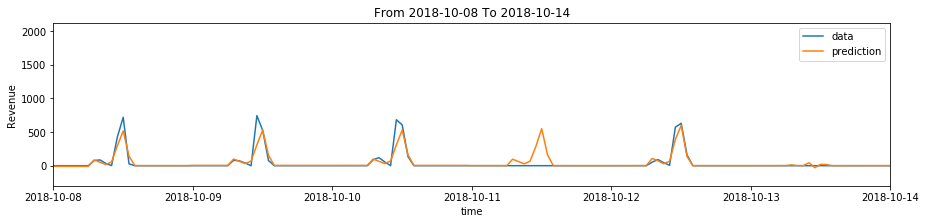

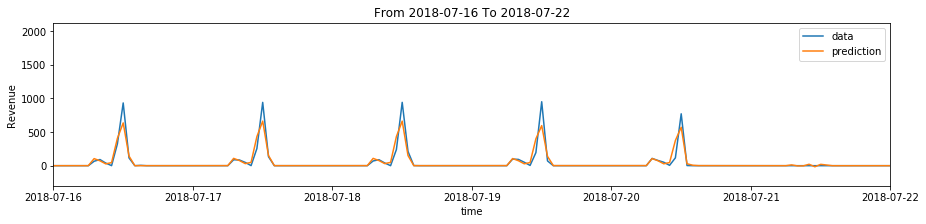

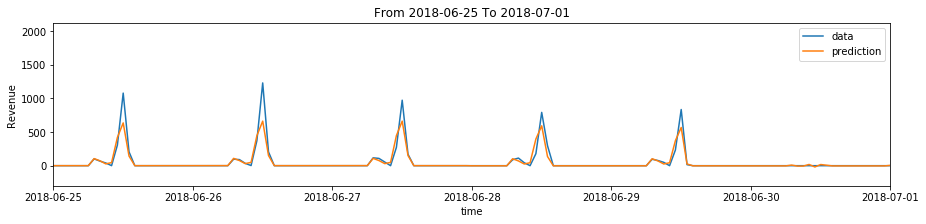

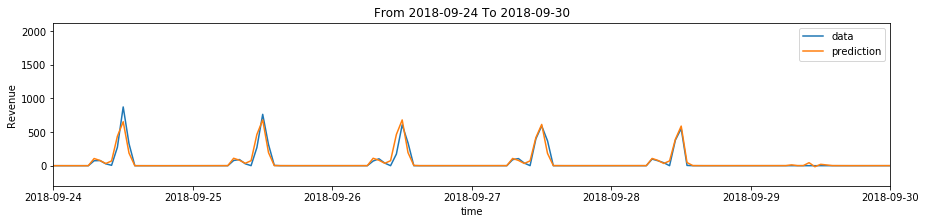

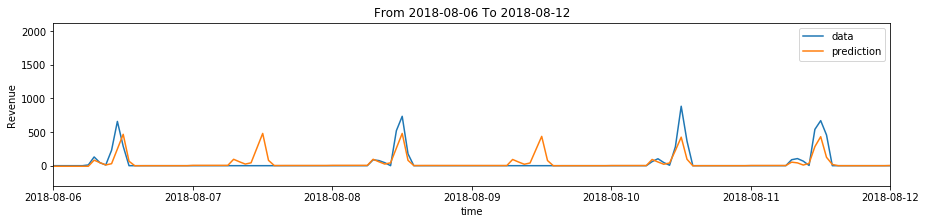

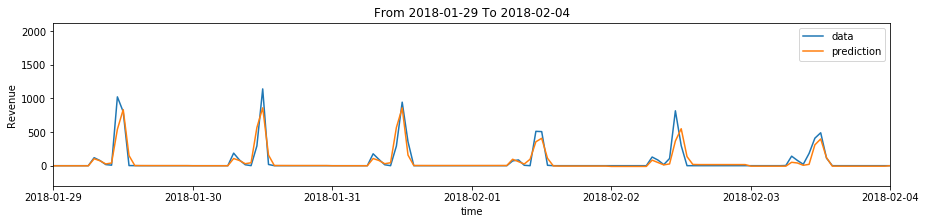

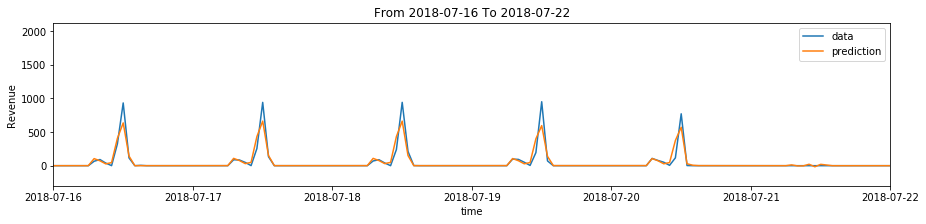

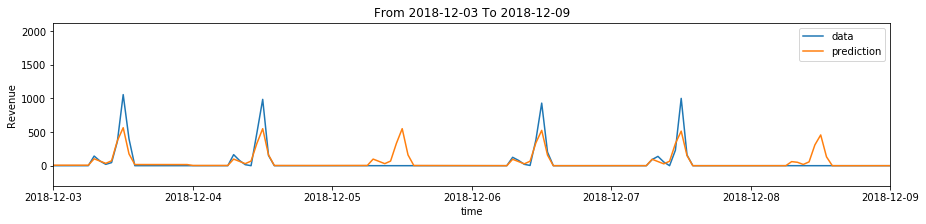

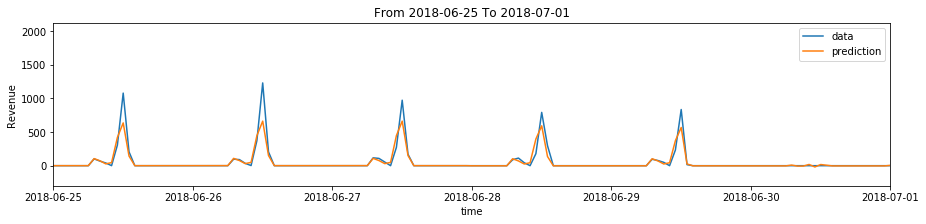

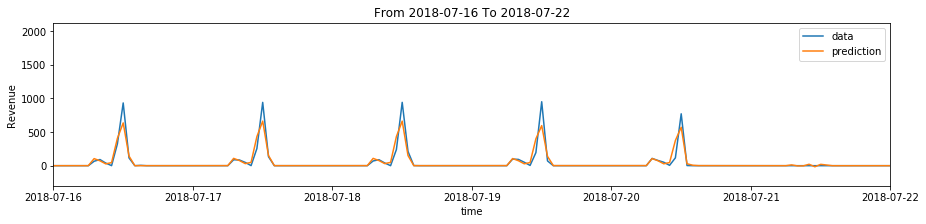

In [ ]:
random_weeks = X_test[['year', 'weekofyear']].sample(10)
for week in random_weeks.iterrows():
    index = (X_test.year == week[1].year) & \
            (X_test.weekofyear == week[1].weekofyear)
    data = y_test[index]
    plot_performance(data, data.index[0].date(), data.index[-1].date())

## Measuring the error

In [ ]:
#RMSE for xgboost
from math import sqrt
sqrt(mean_squared_error(y_true=y_test,
                   y_pred=X_test_pred))

83.89814347448724

In [ ]:
#RMSE for combined prediction
combined_prediction = X_test_pred_cat*0.1+X_test_pred*0.7+X_test_pred_light*0.2
sqrt(mean_squared_error(y_true=y_test,
                   y_pred=combined_prediction))

83.80584116977828

In [ ]:
#MAE for xgboost
mean_absolute_error(y_true=y_test,
                   y_pred=X_test_pred)

28.414446695993025

In [ ]:
#MAE for combined prediction
mean_absolute_error(y_true=y_test,
                   y_pred=combined_prediction)

27.91657781544064

In [ ]:
#R2 score xgboost
from sklearn.metrics import r2_score
r2_score(y_true=y_test, y_pred=X_test_pred)

0.7099469894072661

In [ ]:
#R2 Score catboost
r2_score(y_true=y_test, y_pred=X_test_pred_cat)

0.696292294459128

In [ ]:
#R2 score lightGBM
r2_score(y_true=y_test, y_pred=X_test_pred_light)

0.7030019504270117

In [ ]:
#R2 score for combined prediction
r2_score(y_true=y_test, y_pred=combined_prediction)

0.7105848541575337

### Worst Predicted days

In [ ]:
#XGBoost model
X_test['Revenue'] = y_test
X_test['Prediction'] = X_test_pred
X_test['error'] = y_test - X_test_pred
X_test['abs_error'] = X_test['error'].apply(np.abs)
error_by_day = X_test.groupby(['year','month','dayofmonth']) \
   .mean()[['Revenue','Prediction','error','abs_error']]

error_by_day.sort_values('error', ascending=True).head(15)

Revenue  Prediction      error  abs_error
year month dayofmonth                                           
2018 3     2               0.0   73.728859 -73.728859  73.728859
     1     12              0.0   62.757645 -62.757645  62.757645
     2     12              0.0   60.502598 -60.502598  60.850292
     5     21              0.0   60.138615 -60.138614  60.138614
     4     3               0.0   59.700062 -59.700060  59.700060
     5     5               0.0   57.905365 -57.905365  57.905365
     10    2               0.0   57.061012 -57.061012  57.061012
     9     12              0.0   56.919468 -56.919466  56.919466
     11    2               0.0   56.405502 -56.405501  56.405501
     12    5               0.0   56.272980 -56.272981  56.272981
     10    3               0.0   55.973022 -55.973023  55.973023
     5     31              0.0   55.411808 -55.411807  57.819633
     2     9               0.0   55.318810 -55.318810  55.318810
     8     15              0.0   54.577625 -54.577626  59.920987
     3     30              0.0   52.870251 -52.870249  52.870249

In [ ]:
#Combined model
X_test['Revenue'] = y_test
X_test['Prediction'] = combined_prediction
X_test['error'] = y_test - combined_prediction
X_test['abs_error'] = X_test['error'].apply(np.abs)
error_by_day = X_test.groupby(['year','month','dayofmonth']) \
   .mean()[['Revenue','Prediction','error','abs_error']]

error_by_day.sort_values('error', ascending=True).head(15)

Revenue  Prediction      error  abs_error
year month dayofmonth                                           
2018 3     2               0.0   67.814757 -67.814757  67.814757
     5     21              0.0   60.646954 -60.646954  60.646954
     2     12              0.0   60.429176 -60.429176  60.429176
     1     12              0.0   58.415209 -58.415209  58.415209
     10    2               0.0   56.708396 -56.708396  56.708396
     12    5               0.0   56.147632 -56.147632  56.147632
     4     3               0.0   55.978621 -55.978621  55.978621
     9     12              0.0   55.683040 -55.683040  55.683040
     10    3               0.0   55.588377 -55.588377  55.588377
     5     31              0.0   55.155582 -55.155582  56.536228
           5               0.0   54.971159 -54.971159  54.971159
     11    2               0.0   53.482077 -53.482077  53.482077
     3     30              0.0   53.153679 -53.153679  53.153679
     10    11              0.0   52.535136 -52.535136  52.535136
     2     9               0.0   51.985181 -51.985181  51.985181

### Official public holidays in Germany + Munich local holidays 2018<br>
**January 2018**<br>
01.01.2018	Mo	New Year´s Day<br>
06.01.2018	Sa	Epiphany<br>
**February 2018**<br>
<font color='red'>12.02.2018	Mo	Fastnacht</font><br>
**March 2018**<br>
<font color='red'>30.03.2018	Fr	Good Friday	</font><br>
**April 2018**<br>
01.04.2018	Su	Easter<br>
02.04.2018	Mo	Easter Monday<br>
**May 2018**<br>
01.05.2018	Tu	Labour Day<br>
10.05.2018	Th	Ascension Day<br>
20.05.2018	Su	Whitsun	<br>
<font color='red'>21.05.2018	Mo	Whit Monday	</font><br>
<font color='red'>31.05.2018	Th	Corpus Christi	</font><br>
**August 2018**<br>
08.08.2018	We	Day of peace<br>
15.08.2018	We	Assumption Day<br>
**October 2018**<br>
<font color='red'>03.10.2018	We	Day of German Unity	</font><br>
31.10.2018	We	Reformation Day	<br>
**November 2018**<br>
01.11.2018	Th	All Saints' Day	<br>
21.11.2018	We	Day of Repentance and Prayer<br>
**December 2018**<br>
25.12.2018	Tu	Christmas	<br>
26.12.2018	We	Second Day of Christmas<br>

In [ ]:
lehel_revenue_daily = lehel_revenue_hourly.resample('D').sum()
lehel_revenue_daily[lehel_revenue_daily.index=="2017-03-02"]

,Revenue
Date,
2017-03-02,1354.9


In [ ]:
error_by_day.iloc[(error_by_day.index.get_level_values('month') == 5) & (error_by_day.index.get_level_values('dayofmonth') == 31)]

,,,Revenue,Prediction,error,abs_error
year,month,dayofmonth,,,,
2018,5,31,0.0,55.155582,-55.155582,56.536228


In [ ]:
error_by_day.iloc[(error_by_day.index.get_level_values('month') == 10) & (error_by_day.index.get_level_values('dayofmonth') == 3)]

,,,Revenue,Prediction,error,abs_error
year,month,dayofmonth,,,,
2018,10,3,0.0,55.588377,-55.588377,55.588377


### Best Predicted Days

In [ ]:
error_by_day.sort_values('abs_error', ascending=True).head(10)

Revenue  Prediction     error  abs_error
year month dayofmonth                                          
2018 7     28              0.0    2.301287 -2.301287   3.523303
           29              0.0    2.273028 -2.273028   3.528665
           21              0.0    2.309928 -2.309928   3.580388
           22              0.0    2.292423 -2.292423   3.587376
     1     28              0.0    2.724616 -2.724616   3.622729
           21              0.0    2.722481 -2.722481   3.622915
           27              0.0    2.868666 -2.868666   3.655404
           20              0.0    2.854300 -2.854300   3.656989
     3     31              0.0    1.249381 -1.249381   3.661975
     4     22              0.0    1.250690 -1.250690   3.762051

In [ ]:
lehel_items_revenue.head(10)

,CashPoint,ItemNumber,Amount,ItemDescription,Revenue,NetTotal
Date,,,,,,
2011-03-01 07:29:00,1,511,1,"Backwaren 1,00","1,00","5,54"
2011-03-01 07:30:00,1,1211,1,LeberkÃƒÂ¤se Semmel,"0,96","4,16"
2011-03-01 07:30:00,1,500,1,Semmeln,"0,20","4,16"
2011-03-01 07:34:00,1,1213,1,LeberkÃƒÂ¤se Teller,"2,03","12,61"
2011-03-01 07:34:00,1,500,1,Semmeln,"0,25","12,61"
2011-03-01 07:34:00,1,602,1,"Croissant 0,90","0,85","6,52"
2011-03-01 07:35:00,1,600,1,"Butterbreze 1,10","0,85","1,28"
2011-03-01 07:35:00,1,612,1,"belegte Backw. 1,40","1,30","1,28"
2011-03-01 07:35:00,1,507,1,"Breze 0,65","0,35","10,22"


In [ ]:
top1 = lehel_items_revenue.loc[lehel_items_revenue['ItemDescription'] == 'Beilage a 0,45']
top1 = top1.drop(columns=['CashPoint','ItemNumber','Revenue','ItemDescription','NetTotal'])
top1.head()

,Amount
Date,
2011-03-01 11:00:00,1
2011-03-01 11:02:00,1
2011-03-01 11:05:00,1
2011-03-01 11:05:00,1
2011-03-01 11:06:00,1


In [ ]:
top1_daily = top1.resample('D').sum()
top1_daily.head()

,Amount
Date,
2011-01-02,206
2011-01-03,170
2011-01-04,153
2011-01-05,0
2011-01-06,213


In [ ]:
top1_daily.describe()

,Amount
count,2918.000000
mean,54.263194
std,73.443403
min,-1.000000
25%,0.000000
50%,0.000000
75%,112.000000
max,318.000000


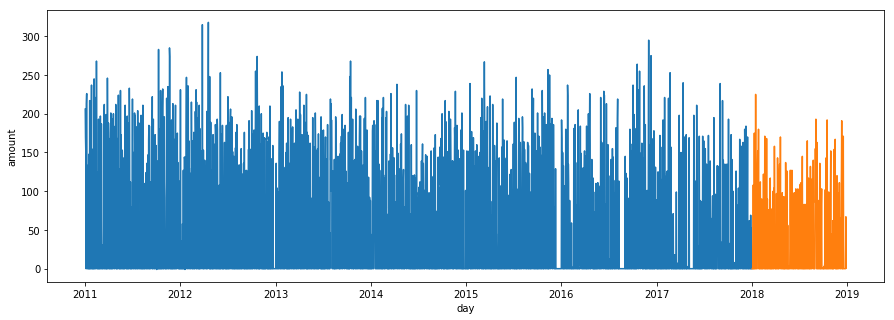

In [ ]:
top1_train, top1_test = split_data(top1_daily, '01-Jan-2018')

plt.figure(figsize=(15,5))
plt.xlabel('day')
plt.ylabel('amount')
plt.plot(top1_train.index,top1_train)
plt.plot(top1_test.index,top1_test)
plt.show()


In [ ]:
def create_features_top(df):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
     
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    return X

In [ ]:
X_train1, y_train1 = create_features_top(top1_train), top1_train['Amount']
X_test1, y_test1   = create_features_top(top1_test), top1_test['Amount']

X_train1.shape, y_train1.shape

((2557, 7), (2557,))

In [ ]:
reg1 = xgb.XGBRegressor(n_estimators=10000,
                       #nthread=4,
                       min_child_weight=6,
                       learning_rate=0.8,
                       subsample=0.7,
                       max_depth=10,
                       colsample_bytree=0.7,
                       tree_method='gpu_exact')

reg1.fit(X_train1, y_train1,
        eval_set=[(X_train1, y_train1), (X_test1, y_test1)],
        early_stopping_rounds=90, #stop if n consequent rounds without decrease of error
        verbose=False) # Change verbose to True if you want to see it train
X_test_pred1 = reg1.predict(X_test1)

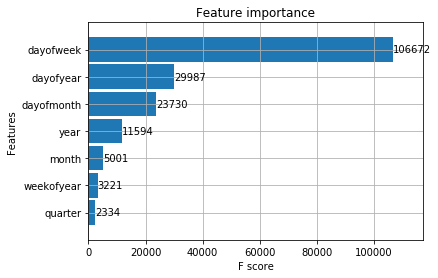

In [ ]:
xgb.plot_importance(reg1, height=0.9)

In [ ]:
# create a difference transform of the dataset
def difference(dataset):
	diff = list()
	for i in range(1, len(dataset)):
		value = dataset[i] - dataset[i - 1]
		diff.append(value)
	return numpy.array(diff)
 
# Make a prediction give regression coefficients and lag obs
def predict(coef, history):
	yhat = coef[0]
	for i in range(1, len(coef)):
		yhat += coef[i] * history[-i]
	return yhat

In [ ]:
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.ar_model import AR
from sklearn.metrics import mean_squared_error
import numpy

series = top1_daily

# split dataset
X = difference(series.values)
size = int(len(X) * (len(X_test1)/len(X_train1)))
train, test = X[0:size], X[size:]
# train autoregression
model = AR(train)
model_fit = model.fit(maxlag=6, disp=False)
window = model_fit.k_ar
coef = model_fit.params
# walk forward over time steps in test
history = [train[i] for i in range(len(train))]
predictions = list()
for t in range(len(test)):
	yhat = predict(coef, history)
	obs = test[t]
	predictions.append(yhat)
	history.append(obs)
error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)

Test MSE: 5418.166


In [ ]:
mean_squared_error(y_true=test,
                   y_pred=predictions)

5418.166112567208

In [ ]:
r2_score(y_true=test, y_pred=predictions)

0.4610801210997322

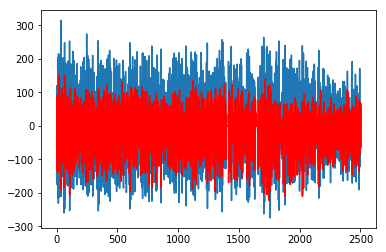

In [ ]:
# plot
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
(1-len(X_test1)/len(X_train1))

0.858818928431756

In [ ]:
len(X)

2917

In [ ]:
len(X_train1)

2557

In [ ]:
def plot_performance_top(base_data, date_from, date_to, title=None):
    plt.figure(figsize=(15,3))
    if title == None:
        plt.title('From {0} To {1}'.format(date_from, date_to))
    else:
        plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Amount')
    plt.plot(top1_daily.index,top1_daily, label='data')
    plt.plot(X_test1.index,X_test_pred1, label='prediction')
    plt.legend()
    plt.xlim(left=date_from, right=date_to)

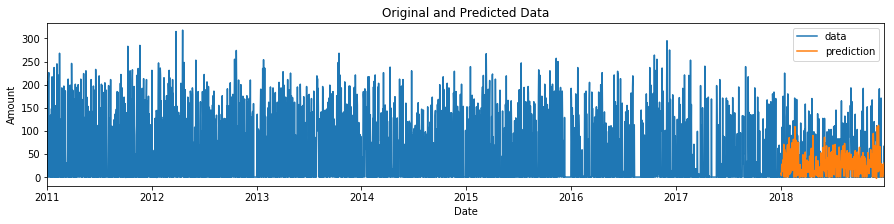

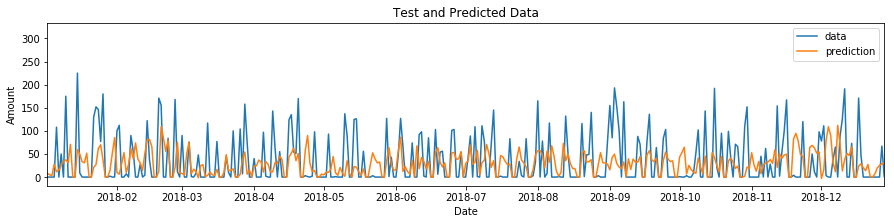

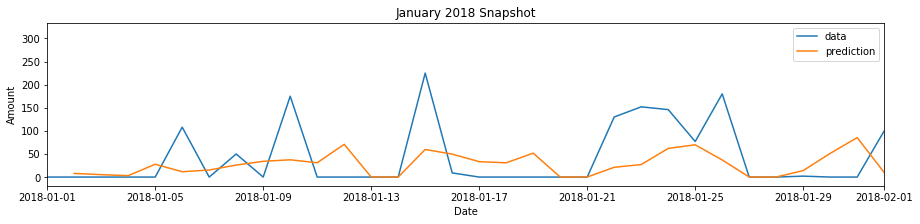

In [ ]:
plot_performance_top(top1_daily, top1_daily.index[0].date(), top1_daily.index[-1].date(),
                 'Original and Predicted Data')

plot_performance_top(y_test1, y_test1.index[0].date(), y_test1.index[-1].date(),
                 'Test and Predicted Data')

plot_performance_top(y_test1, '01-01-2018', '02-01-2018', 'January 2018 Snapshot')

plt.legend()

plt.show()

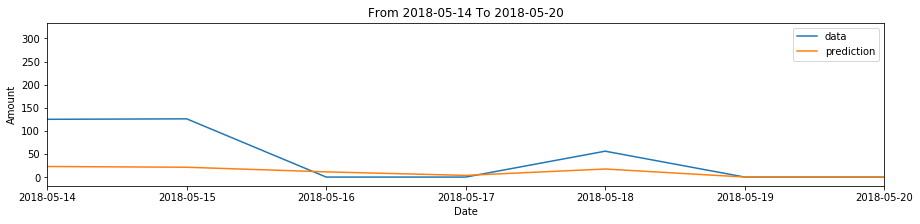

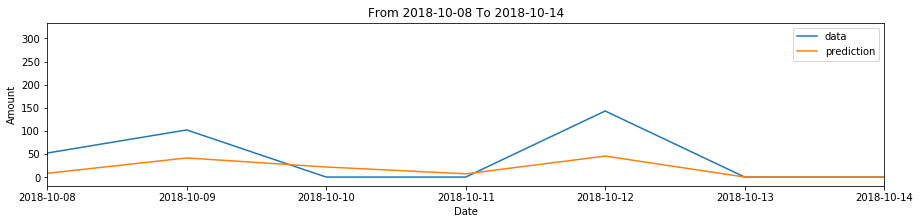

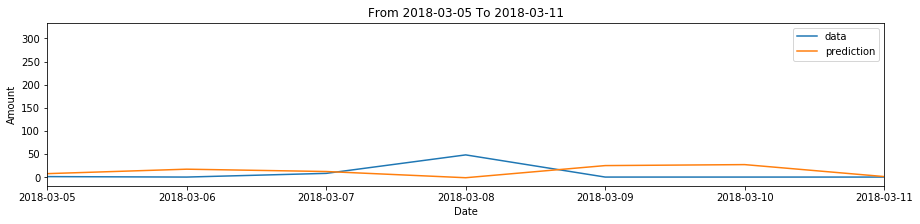

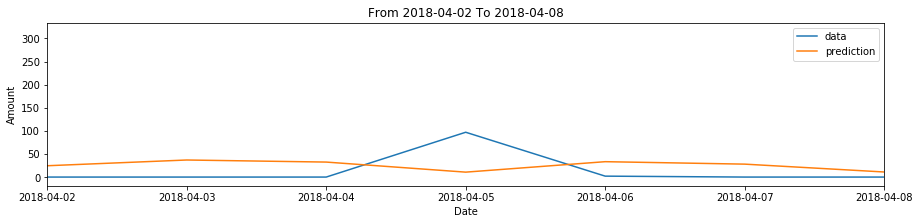

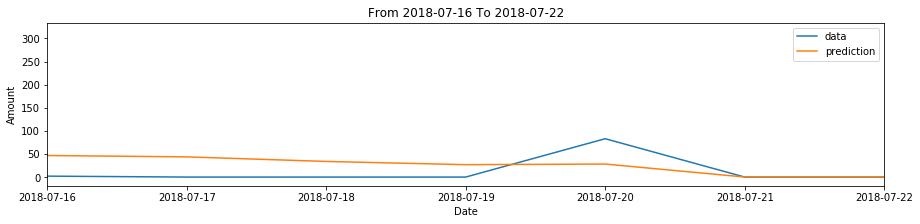

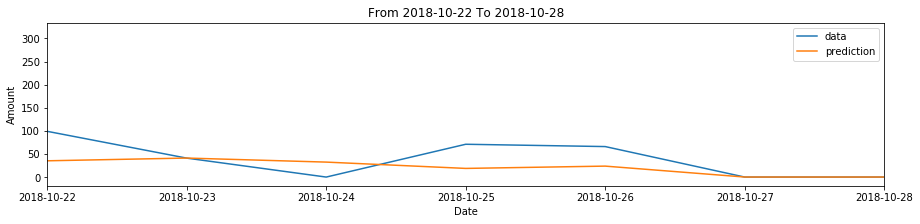

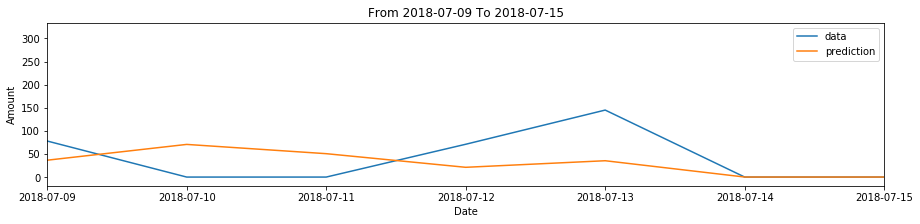

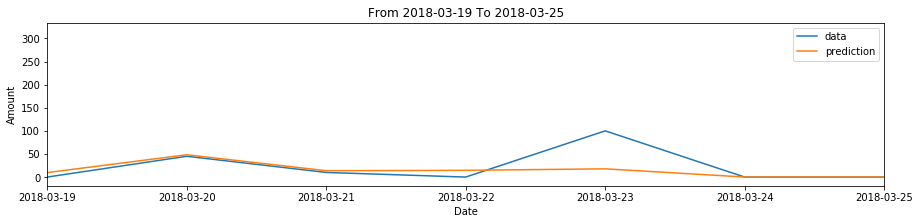

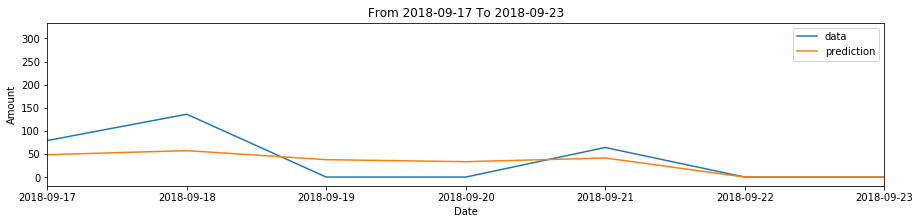

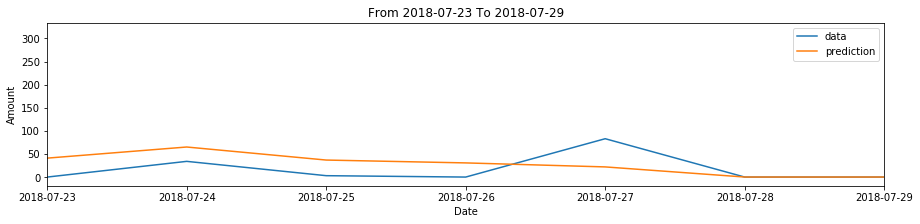

In [ ]:
random_weeks1 = X_test1[['year', 'weekofyear']].sample(10)
for week in random_weeks1.iterrows():
    index = (X_test1.year == week[1].year) & \
            (X_test1.weekofyear == week[1].weekofyear)
    data = y_test1[index]
    plot_performance_top(data, data.index[0].date(), data.index[-1].date())

In [ ]:
sqrt(mean_squared_error(y_true=y_test1,
                   y_pred=X_test_pred1))

54.115010407654985

In [ ]:
#MAE for xgboost
mean_absolute_error(y_true=y_test1,
                   y_pred=X_test_pred1)

38.49582421812654

In [ ]:
#R2 score xgboost
r2_score(y_true=y_test1, y_pred=X_test_pred1)

-0.04035692124569934

In [ ]:
from RegscorePy import *
aic.aic(y_test1.values.astype(np.float64), X_test_pred1.astype(np.float64), 7)

2895.582578139885

# Giesing

In [ ]:
giesing_items_revenue = pd.read_csv('giesing_revenue_only.csv', engine="python", index_col=0)

In [ ]:
giesing_items_revenue.index = pd.to_datetime(giesing_items_revenue.index)

In [ ]:
giesing_items_revenue.head()

,Revenue
Date,
2011-03-01 07:25:00,0.25
2011-03-01 07:25:00,0.25
2011-03-01 07:25:00,0.35
2011-03-01 07:25:00,0.60
2011-03-01 07:25:00,1.35


In [ ]:
giesing_revenue_hourly = giesing_items_revenue.resample('h').sum()

In [ ]:
giesing_revenue_hourly.head(10)

,Revenue
Date,
2011-01-02 07:00:00,3.551100e+02
2011-01-02 08:00:00,3.855800e+02
2011-01-02 09:00:00,1.566600e+02
2011-01-02 10:00:00,2.077000e+01
2011-01-02 11:00:00,2.780640e+03
2011-01-02 12:00:00,2.898250e+03
2011-01-02 13:00:00,4.427800e+02
2011-01-02 14:00:00,1.776357e-15
2011-01-02 15:00:00,0.000000e+00


C:\ProgramData\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



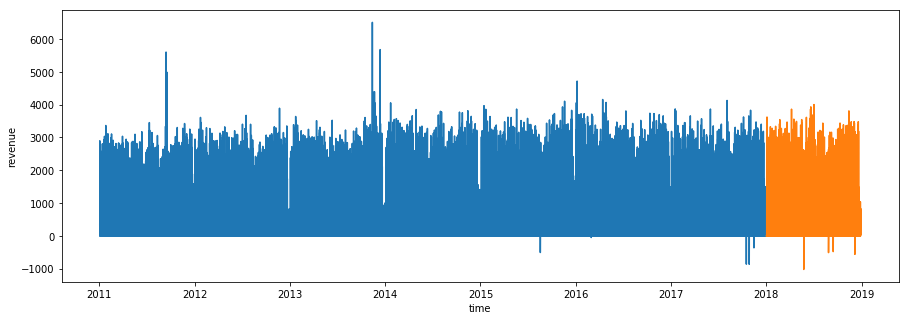

In [ ]:
train1, test1 = split_data(giesing_revenue_hourly, '01-Jan-2018')

plt.figure(figsize=(15,5))
plt.xlabel('time')
plt.ylabel('revenue')
plt.plot(train1.index,train1)
plt.plot(test1.index,test1)
plt.show()

In [ ]:
trace1 = go.Scatter(
                    x = train1.index,
                    y = train1.Revenue,
                    mode = "lines",
                    name = "train",
                    marker = dict(color = 'rgba(70, 130, 180, 1)'))

trace2 = go.Scatter(
                    x = test1.index,
                    y = test1.Revenue,
                    mode = "lines",
                    name = "test",
                    marker = dict(color = 'rgba(255, 99, 71, 1)'))

data = [trace1,trace2]
layout = dict(title = 'Giesing Revenue Hourly',
              xaxis= dict(title= 'DateTime',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

In [ ]:
X_train1, y_train1 = create_features(train1), train1['Revenue']
X_test1, y_test1   = create_features(test1), test1['Revenue']

X_train1.shape, y_train1.shape

((61338, 8), (61338,))

## Create and Train XGBoost Model

In [ ]:
reg1 = xgb.XGBRegressor(n_estimators=10000,
                       nthread=4,
                       min_child_weight=6,
                       learning_rate=0.5,
                       subsample=0.7,
                       max_depth=6,
                       colsample_bytree=0.6,
                       tree_method='gpu_exact')
reg1.fit(X_train1, y_train1,
        eval_set=[(X_train1, y_train1), (X_test1, y_test1)],
        early_stopping_rounds=90, #stop if n consequent rounds without decrease of error
        verbose=False) # Change verbose to True if you want to see it train
X_test_pred1 = reg1.predict(X_test1)

##### CatBoost model

In [ ]:
#CatBoostRegressor
train_pool1 = Pool(X_train1, y_train1) 
test_pool1 = Pool(X_test1)
cbm0 = CatBoostRegressor(depth=10, learning_rate=0.01, eval_metric='RMSE',task_type="GPU")
#task_type="GPU"
cbm0.fit(train_pool1)

X_test_pred_cat1 = cbm0.predict(test_pool1)

0:	learn: 618.3215292	total: 16.4ms	remaining: 16.4s
1:	learn: 613.3762858	total: 30.6ms	remaining: 15.3s
2:	learn: 608.4718725	total: 43.7ms	remaining: 14.5s
3:	learn: 603.6275105	total: 56.9ms	remaining: 14.2s
4:	learn: 598.8521563	total: 69.3ms	remaining: 13.8s
5:	learn: 594.1213138	total: 82.4ms	remaining: 13.7s
6:	learn: 589.4615164	total: 96.4ms	remaining: 13.7s
7:	learn: 584.8521122	total: 109ms	remaining: 13.6s
8:	learn: 580.2723221	total: 122ms	remaining: 13.4s
9:	learn: 575.7626938	total: 134ms	remaining: 13.3s
10:	learn: 571.2887126	total: 146ms	remaining: 13.1s
11:	learn: 566.8957804	total: 159ms	remaining: 13.1s
12:	learn: 562.5951429	total: 172ms	remaining: 13s
13:	learn: 558.3058717	total: 185ms	remaining: 13s
14:	learn: 554.0605019	total: 197ms	remaining: 12.9s
15:	learn: 549.8670335	total: 210ms	remaining: 12.9s
16:	learn: 545.7306395	total: 224ms	remaining: 13s
17:	learn: 541.6544154	total: 237ms	remaining: 12.9s
18:	learn: 537.5969394	total: 248ms	remaining: 12.8s
19

155:	learn: 289.2612724	total: 1.82s	remaining: 9.86s
156:	learn: 288.7248298	total: 1.83s	remaining: 9.85s
157:	learn: 288.1922835	total: 1.84s	remaining: 9.83s
158:	learn: 287.6701550	total: 1.85s	remaining: 9.81s
159:	learn: 287.1529491	total: 1.86s	remaining: 9.79s
160:	learn: 286.6389598	total: 1.88s	remaining: 9.78s
161:	learn: 286.1104957	total: 1.89s	remaining: 9.76s
162:	learn: 285.6108071	total: 1.9s	remaining: 9.74s
163:	learn: 285.1383766	total: 1.91s	remaining: 9.72s
164:	learn: 284.6669361	total: 1.92s	remaining: 9.7s
165:	learn: 284.1611254	total: 1.93s	remaining: 9.69s
166:	learn: 283.7061413	total: 1.94s	remaining: 9.66s
167:	learn: 283.2505295	total: 1.95s	remaining: 9.64s
168:	learn: 282.8170139	total: 1.96s	remaining: 9.63s
169:	learn: 282.3632045	total: 1.97s	remaining: 9.61s
170:	learn: 281.9326916	total: 1.98s	remaining: 9.59s
171:	learn: 281.4873609	total: 1.99s	remaining: 9.58s
172:	learn: 281.0679206	total: 2s	remaining: 9.56s
173:	learn: 280.6540100	total: 2.

312:	learn: 255.8857794	total: 3.65s	remaining: 8.02s
313:	learn: 255.8254565	total: 3.66s	remaining: 8s
314:	learn: 255.7373608	total: 3.68s	remaining: 8s
315:	learn: 255.6529079	total: 3.69s	remaining: 8s
316:	learn: 255.5386710	total: 3.71s	remaining: 7.99s
317:	learn: 255.4611614	total: 3.72s	remaining: 7.98s
318:	learn: 255.3836118	total: 3.73s	remaining: 7.97s
319:	learn: 255.3127575	total: 3.75s	remaining: 7.97s
320:	learn: 255.1833055	total: 3.76s	remaining: 7.96s
321:	learn: 255.1055243	total: 3.78s	remaining: 7.95s
322:	learn: 255.0084076	total: 3.79s	remaining: 7.95s
323:	learn: 254.9435962	total: 3.8s	remaining: 7.94s
324:	learn: 254.8774911	total: 3.82s	remaining: 7.93s
325:	learn: 254.8131132	total: 3.83s	remaining: 7.93s
326:	learn: 254.7496774	total: 3.85s	remaining: 7.92s
327:	learn: 254.6776307	total: 3.86s	remaining: 7.91s
328:	learn: 254.5663908	total: 3.88s	remaining: 7.91s
329:	learn: 254.4931360	total: 3.89s	remaining: 7.9s
330:	learn: 254.4082783	total: 3.9s	rem

466:	learn: 246.0461245	total: 5.52s	remaining: 6.3s
467:	learn: 245.9979967	total: 5.53s	remaining: 6.29s
468:	learn: 245.9287828	total: 5.55s	remaining: 6.28s
469:	learn: 245.8711943	total: 5.56s	remaining: 6.27s
470:	learn: 245.8302308	total: 5.57s	remaining: 6.26s
471:	learn: 245.7850749	total: 5.58s	remaining: 6.25s
472:	learn: 245.7426960	total: 5.6s	remaining: 6.24s
473:	learn: 245.6784386	total: 5.61s	remaining: 6.22s
474:	learn: 245.6262288	total: 5.62s	remaining: 6.21s
475:	learn: 245.5599269	total: 5.63s	remaining: 6.2s
476:	learn: 245.4965398	total: 5.64s	remaining: 6.19s
477:	learn: 245.4609209	total: 5.65s	remaining: 6.17s
478:	learn: 245.3799558	total: 5.67s	remaining: 6.16s
479:	learn: 245.3444561	total: 5.68s	remaining: 6.15s
480:	learn: 245.3046127	total: 5.69s	remaining: 6.14s
481:	learn: 245.2560416	total: 5.7s	remaining: 6.12s
482:	learn: 245.2201154	total: 5.71s	remaining: 6.11s
483:	learn: 245.1777836	total: 5.72s	remaining: 6.1s
484:	learn: 245.1357083	total: 5.

627:	learn: 238.9410049	total: 7.38s	remaining: 4.37s
628:	learn: 238.8780191	total: 7.39s	remaining: 4.36s
629:	learn: 238.8488222	total: 7.4s	remaining: 4.34s
630:	learn: 238.7959756	total: 7.41s	remaining: 4.33s
631:	learn: 238.7389916	total: 7.42s	remaining: 4.32s
632:	learn: 238.6805514	total: 7.43s	remaining: 4.31s
633:	learn: 238.6531753	total: 7.44s	remaining: 4.29s
634:	learn: 238.6073433	total: 7.45s	remaining: 4.28s
635:	learn: 238.5814808	total: 7.46s	remaining: 4.27s
636:	learn: 238.5409539	total: 7.47s	remaining: 4.26s
637:	learn: 238.5183563	total: 7.48s	remaining: 4.25s
638:	learn: 238.4441095	total: 7.49s	remaining: 4.23s
639:	learn: 238.4155334	total: 7.5s	remaining: 4.22s
640:	learn: 238.3725358	total: 7.51s	remaining: 4.21s
641:	learn: 238.3279107	total: 7.52s	remaining: 4.2s
642:	learn: 238.2903971	total: 7.54s	remaining: 4.18s
643:	learn: 238.2749398	total: 7.54s	remaining: 4.17s
644:	learn: 238.2441099	total: 7.55s	remaining: 4.16s
645:	learn: 238.2108143	total: 

789:	learn: 232.2907687	total: 9.23s	remaining: 2.46s
790:	learn: 232.2423243	total: 9.25s	remaining: 2.44s
791:	learn: 232.2137668	total: 9.26s	remaining: 2.43s
792:	learn: 232.2003136	total: 9.27s	remaining: 2.42s
793:	learn: 232.1504750	total: 9.28s	remaining: 2.41s
794:	learn: 232.1120079	total: 9.29s	remaining: 2.4s
795:	learn: 232.0925337	total: 9.3s	remaining: 2.38s
796:	learn: 232.0390567	total: 9.31s	remaining: 2.37s
797:	learn: 232.0039082	total: 9.32s	remaining: 2.36s
798:	learn: 231.9743948	total: 9.34s	remaining: 2.35s
799:	learn: 231.9482335	total: 9.35s	remaining: 2.34s
800:	learn: 231.8998166	total: 9.36s	remaining: 2.32s
801:	learn: 231.8657090	total: 9.37s	remaining: 2.31s
802:	learn: 231.7608259	total: 9.38s	remaining: 2.3s
803:	learn: 231.7335689	total: 9.39s	remaining: 2.29s
804:	learn: 231.6653718	total: 9.4s	remaining: 2.28s
805:	learn: 231.5981007	total: 9.41s	remaining: 2.26s
806:	learn: 231.5392281	total: 9.42s	remaining: 2.25s
807:	learn: 231.5244288	total: 9

943:	learn: 226.2631950	total: 10.9s	remaining: 647ms
944:	learn: 226.2352388	total: 10.9s	remaining: 635ms
945:	learn: 226.2068547	total: 10.9s	remaining: 624ms
946:	learn: 226.1991331	total: 10.9s	remaining: 612ms
947:	learn: 226.1287224	total: 10.9s	remaining: 600ms
948:	learn: 226.0755792	total: 11s	remaining: 589ms
949:	learn: 226.0060534	total: 11s	remaining: 577ms
950:	learn: 225.9595679	total: 11s	remaining: 566ms
951:	learn: 225.9382980	total: 11s	remaining: 554ms
952:	learn: 225.8914382	total: 11s	remaining: 542ms
953:	learn: 225.8616343	total: 11s	remaining: 531ms
954:	learn: 225.8223178	total: 11s	remaining: 519ms
955:	learn: 225.8032345	total: 11s	remaining: 508ms
956:	learn: 225.7640465	total: 11s	remaining: 496ms
957:	learn: 225.6846698	total: 11s	remaining: 484ms
958:	learn: 225.6463490	total: 11.1s	remaining: 473ms
959:	learn: 225.5943687	total: 11.1s	remaining: 461ms
960:	learn: 225.5383794	total: 11.1s	remaining: 450ms
961:	learn: 225.4954437	total: 11.1s	remaining: 

#### LightGBM Model

In [ ]:
#LightGBMRegressor
gbm1 = lgb.LGBMRegressor(
    objective='regression',
    num_leaves=11,
    learning_rate=0.006,
    n_estimators=2000)

gbm1.fit(X_train1, y_train1, eval_metric='rmse')

X_test_pred_light1 = gbm1.predict(X_test1)

### Feature Importances

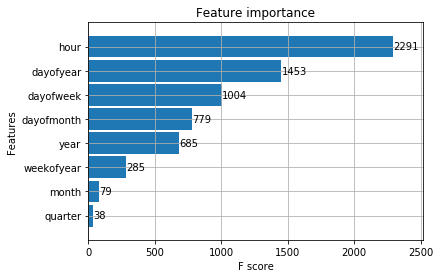

In [ ]:
xgb.plot_importance(reg1, height=0.9)

In [ ]:
def plot_performance1(base_data, date_from, date_to, title=None):
    plt.figure(figsize=(15,3))
    if title == None:
        plt.title('From {0} To {1}'.format(date_from, date_to))
    else:
        plt.title(title)
    plt.xlabel('time')
    plt.ylabel('Revenue')
    plt.plot(giesing_revenue_hourly.index,giesing_revenue_hourly, label='data')
    plt.plot(X_test1.index,X_test_pred1, label='prediction')
    plt.legend()
    plt.xlim(left=date_from, right=date_to)

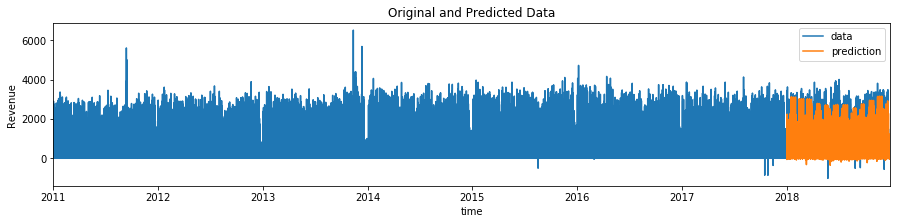

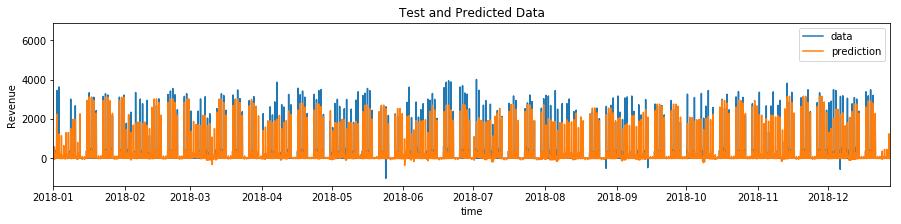

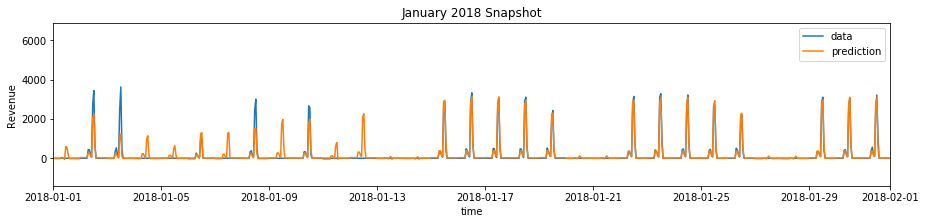

In [ ]:
plot_performance1(giesing_revenue_hourly, giesing_revenue_hourly.index[0].date(), giesing_revenue_hourly.index[-1].date(),
                 'Original and Predicted Data')

plot_performance1(y_test1, y_test1.index[0].date(), y_test1.index[-1].date(),
                 'Test and Predicted Data')

plot_performance1(y_test1, '01-01-2018', '02-01-2018', 'January 2018 Snapshot')

plt.legend()

plt.show()

## Show forecast for ten random weeks

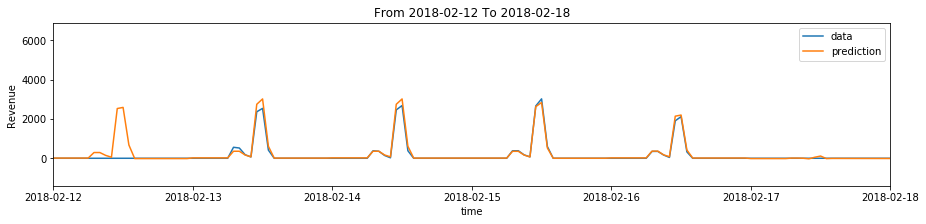

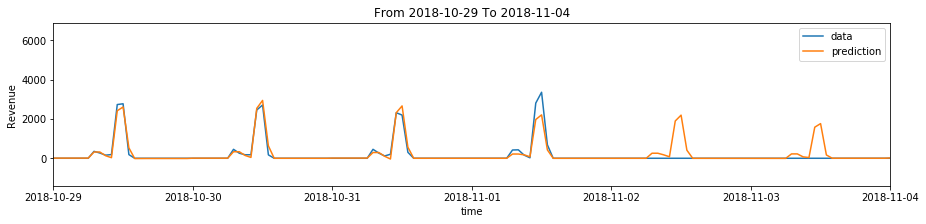

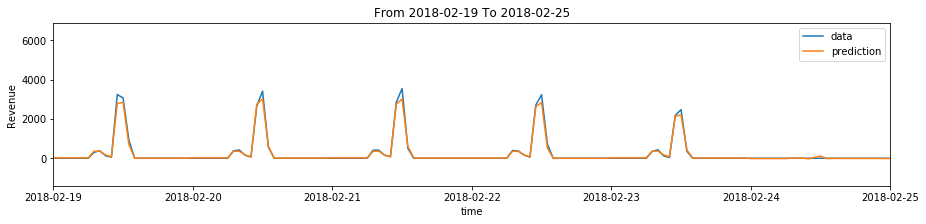

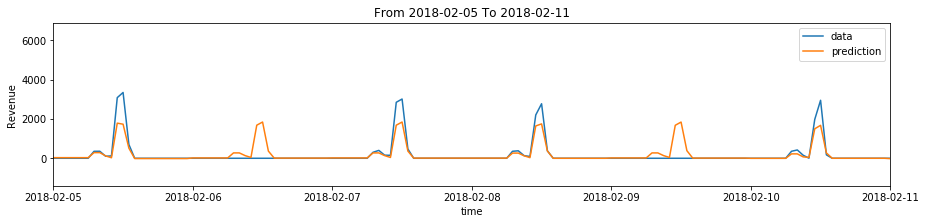

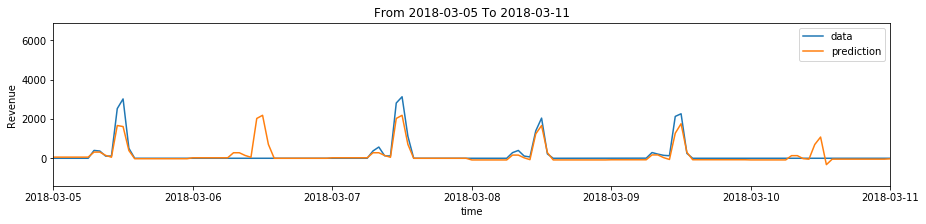

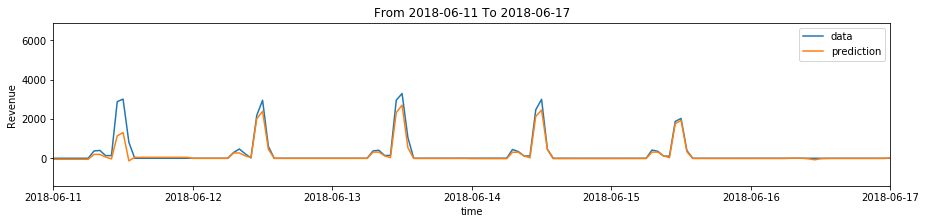

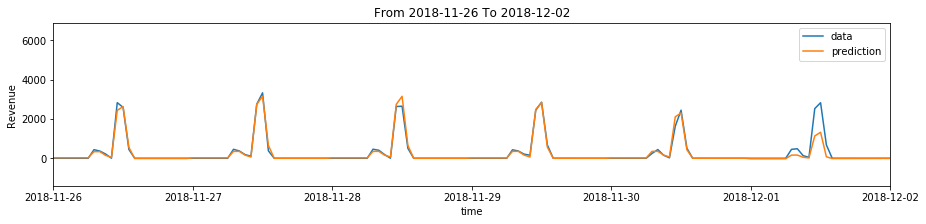

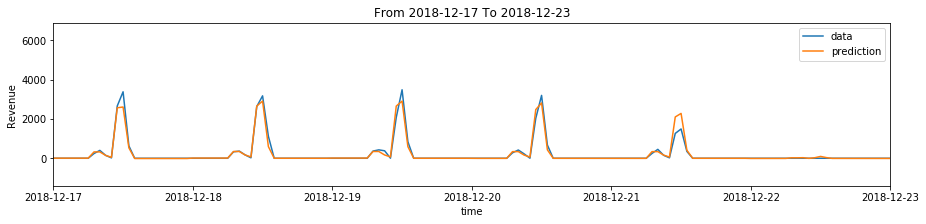

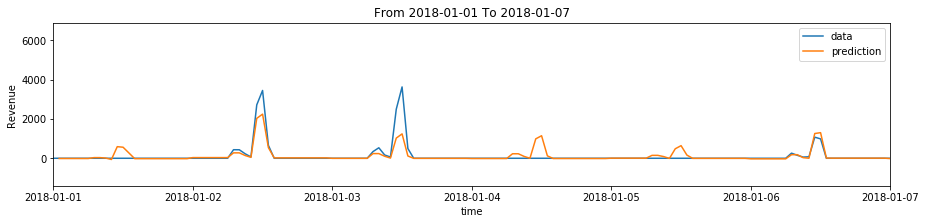

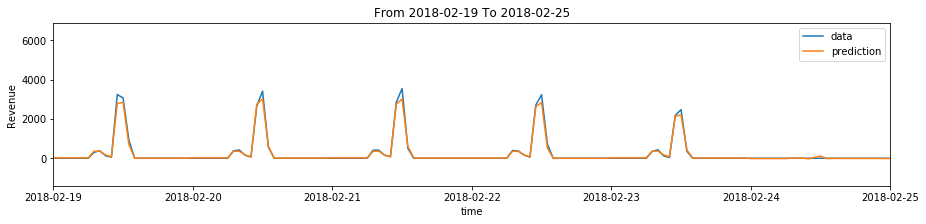

In [ ]:
random_weeks1 = X_test1[['year', 'weekofyear']].sample(10)
for week in random_weeks1.iterrows():
    index = (X_test1.year == week[1].year) & \
            (X_test1.weekofyear == week[1].weekofyear)
    data = y_test1[index]
    plot_performance1(data, data.index[0].date(), data.index[-1].date())

## Measuring the error

In [ ]:
#RMSE for xgboost
from math import sqrt
sqrt(mean_squared_error(y_test1,X_test_pred1))

261.80603605211405

In [ ]:
#MAE for xgboost
mean_absolute_error(y_test1,X_test_pred1)

82.74555907565886

In [ ]:
#R2 score xgboost
from sklearn.metrics import r2_score
r2_score(y_test1,X_test_pred1)

0.817884257008469

In [ ]:
#R2 CatBoost
r2_score(y_test1,X_test_pred_cat1)

0.8175503141933469

In [ ]:
#R2 LightGBM
r2_score(y_test1,X_test_pred_light1)

0.8136552727512104

In [ ]:
#R2 Combined XGBoost and Catboost
r2_score(y_test1,X_test_pred_cat1*0.5+X_test_pred1*0.5)

0.8204817010862101

### Worst Predicted days

In [ ]:
#XGBoost model
X_test1['Revenue'] = y_test1
X_test1['Prediction'] = X_test_pred1
X_test1['error'] = y_test1 - X_test_pred1
X_test1['abs_error'] = X_test1['error'].apply(np.abs)
error_by_day = X_test1.groupby(['year','month','dayofmonth']) \
   .mean()[['Revenue','Prediction','error','abs_error']]

error_by_day.sort_values('error', ascending=True).head(15)

Revenue  Prediction       error   abs_error
year month dayofmonth                                             
2018 2     12              0.0  270.531647 -270.531643  282.541317
     5     5               0.0  256.990143 -256.990134  256.990134
     1     12              0.0  256.295319 -256.295326  256.295326
     3     6               0.0  242.941208 -242.941211  243.439524
     12    5               0.0  237.733429 -237.733427  245.524128
     4     8               0.0  236.145325 -236.145324  236.145324
     3     2               0.0  231.319427 -231.319433  231.319433
     10    2               0.0  230.273041 -230.273035  230.273035
     3     30              0.0  229.524551 -229.524559  229.524559
     5     21              0.0  229.147232 -229.147234  250.223553
     7     10              0.0  225.278809 -225.278807  225.278807
     8     12              0.0  219.392548 -219.392552  219.392552
     11    2               0.0  218.308990 -218.308994  219.821149
     6     10              0.0  216.408905 -216.408901  216.408901
     9     12              0.0  215.657639 -215.657644  243.870271

In [ ]:
from RegscorePy import *
aic.aic(y_test1.values.astype(np.float64), X_test_pred1.astype(np.float64), 8)

96636.19823985483

In [ ]:
aic.aic(y_test1.values.astype(np.float64), X_test_pred_cat1.astype(np.float64), 8)

96652.094550302

In [ ]:
aic.aic(y_test1.values.astype(np.float64), X_test_pred_light1.astype(np.float64), 8)

96835.38654245618

Since the lower AIC value is better we can conclude that XGBoost performs slightly better than CatBoost and LightGBM